## Analysise log
(skip)

In [2]:
import pandas as pd
from pathlib import Path
import json

def get_log(name):
    path = Path('output') / name / 'log.jsonl'
    if not path.exists():
        return None
    data = []
    for line in path.open('r'):
        try:
            clean = line.replace('\x00', '').strip()
            if clean:
                data.append(json.loads(clean))
        except Exception as error:
            pass
    if len(data) == 0:
        return None
    return pd.DataFrame(data).drop_duplicates('target_name').set_index('target_name', drop=True)

# folder_path: Path
# for folder_path in Path('output').glob('*'):
#     if not folder_path.is_dir() or folder_path.name == '.ipynb_checkpoints':
#         continue
#     data: pd.DataFrame = get_log(folder_path.name)
#     if data is None:
#         print(f'No log for {folder_path.name}')
#         continue
#     break

## Add missing

In [5]:
import gzip
import pyrosetta
import sys
import traceback
import pickle
from Bio import SeqIO
import re

sys.path.append('/opt/xchem-fragalysis-2/mferla/crysalin-redux/repo/code')
prc = pyrosetta.rosetta.core
prp = pyrosetta.rosetta.protocols
pru = pyrosetta.rosetta.utility
from thread_tune_v2 import init_pyrosetta, fix_starts, appraise_itxns, SETTINGS
from common_pyrosetta import superpose

from rescore_v2 import analyse_design

In [6]:
import pandas as pd
from pathlib import Path
import json

# info = []
# for path in Path('output/ref/relaxed_pdbs').glob('*.pdb.gz'):
#     info.append(analyse_design(pdb_path=path,
#                                folder_path=path.parent.parent,
#                                template_path=Path('pentakaihemimer_renumbered2.pdb'))
#                )

In [7]:
# import gzip

# original = 'output/ref/relaxed_pdbs/ref_originalA.pdb.gz'
# with gzip.open(original, 'wt') as gfh:
#     gfh.write(Path('pentakaihemimer_renumbered2.pdb').read_text())

# info.append(analyse_design(pdb_path=Path(original),
#                            folder_path=path.parent.parent,
#                            template_path=Path('pentakaihemimer_renumbered2.pdb'))
#                )

In [ ]:
import pandas as pd

pd.DataFrame(info)

## Summary analysis

In [162]:
from IPython.display import display
import pickle
from pathlib import Path
import pandas as pd

path: Path

data = []
for path in Path('output').glob('*/summary/*.pkl'):
    with path.open('rb') as fh:
        data.append(pickle.load(fh))

df = pd.DataFrame(data)
df = df.loc[df.status == 'ok'].copy()
print(f'{len(df)} entries')
df['has_strep'] = df.sequence.str.contains('WSHPQFEKRP')
print(f'{sum(~df.has_strep)} entries lack strep!')
df['N_designed'] = df.mod_idxs.apply(len)
df['N_changes'] = df.apply(lambda row: sum([a!=b for a, b in zip(row.original_seq, row.sequence)]) if str(row.original_seq) != 'nan' else 0, axis=1)
df['group'] = df.name.str.split('_', expand=True)[0]
df['supergroup'] = df.group.str.replace(r'\d+', '', regex=True)\
                           .str.replace('B', '')\
                           .str.replace('big', '')\
                           .str.replace('pocketfill', 'pocket')
df['hallucination_N'] = df.name.str.split('_', expand=True)[1].str.extract(r'(\d+)').fillna(-1).astype(int)
df['length'] = df.sequence.apply(len)
df['ddG'] = df.tagless_complex_dG - df.tagless_monomer_dG + 1931
df['change_ratio'] = df.N_changes / df.N_designed
wt_sasa = df.loc[df.name == 'ref_originalA'].iloc[0].monomer_hydrophobic_sasa
wt_len = df.loc[df.name == 'ref_originalA'].iloc[0].length
df['delta_length'] = df.length - wt_len
df['shifted_delta_length'] = df['delta_length'] - df['delta_length'].min()
#df['delta_hydrophobic_sasa'] = df.monomer_hydrophobic_sasa - wt_sasa #/ (df.length - wt_len)
df['rel_hydrophobic_sasa'] = df.monomer_hydrophobic_sasa / df.length / wt_sasa * wt_len - 1

def pretty(original_seq, final_seq, mod_idx1s):
    if not original_seq or not final_seq or not mod_idx1s:
        return ''
    camelized = ''
    for i, (o, f) in enumerate(zip(original_seq, final_seq)):
        if i+1 not in mod_idx1s and o != f:
            raise ValueError
        elif i+1 not in mod_idx1s:
            camelized += '.'.strip()
        elif o == f:
            camelized += f.lower()
        else:
            camelized += f
    return camelized
        
df['changed_seq'] = df.apply(lambda row: pretty(row.original_seq, row.sequence, row.mod_idxs), axis=1)
df['trimmed_changed_seq'] = df.changed_seq.str.replace(r'\.+', '.', regex=True)

7130 entries
0 entries lack strep!


In [214]:
def camelize(final_seq, mod_idx1s):
    if not final_seq or not mod_idx1s:
        return ''
    return ''.join([f.upper() if i+1 in mod_idx1s else f.lower() for i, f in enumerate(final_seq)])
        
df['camelized_seq'] = df.apply(lambda row: camelize(row.sequence, row.mod_idxs), axis=1)

In [164]:
import numpy as np

def insert_happiness(row):
    return np.array(row.per_res_score)[[idx1-1 for idx1 in row.mod_idxs]].mean()

df['insert_mean_dG'] = df.apply(insert_happiness, axis=1)

/tmp/ipykernel_2755576/2504674471.py:4: RuntimeWarning:

Mean of empty slice.

/opt/xchem-fragalysis-2/mferla/waconda-slurm/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning:

invalid value encountered in scalar divide



In [165]:
df.loc[df.group == 'ref'][['name', 'tagless_complex_dG', 'rmsd']].round(1)

,name,tagless_complex_dG,rmsd
3908,ref_bedØ,-2782.3,1.4
3910,ref_sideB,-2839.5,1.3
3914,ref_posttagØ,-2838.4,1.2
3916,ref_midØ,-2838.5,1.9
3917,ref_posttagB,-2817.9,1.7
3918,ref_sideØ,-2795.4,1.4
3919,ref_midB,-2859.8,1.4
3920,ref_originalA,-2774.1,0.0


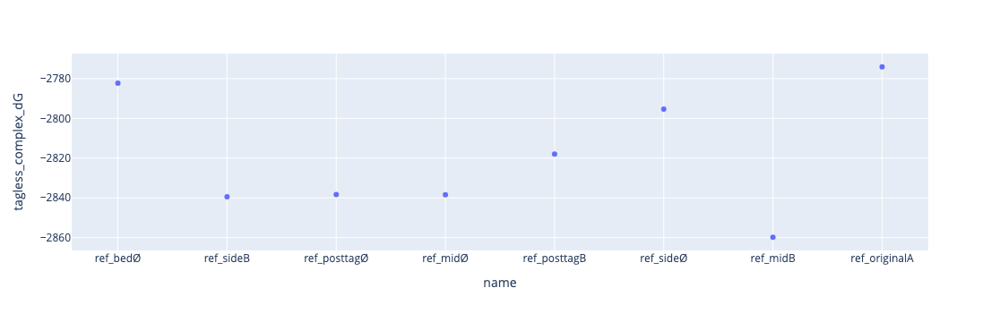

In [166]:
px.scatter(df.loc[df.group == 'ref'], x='name', y='tagless_complex_dG')

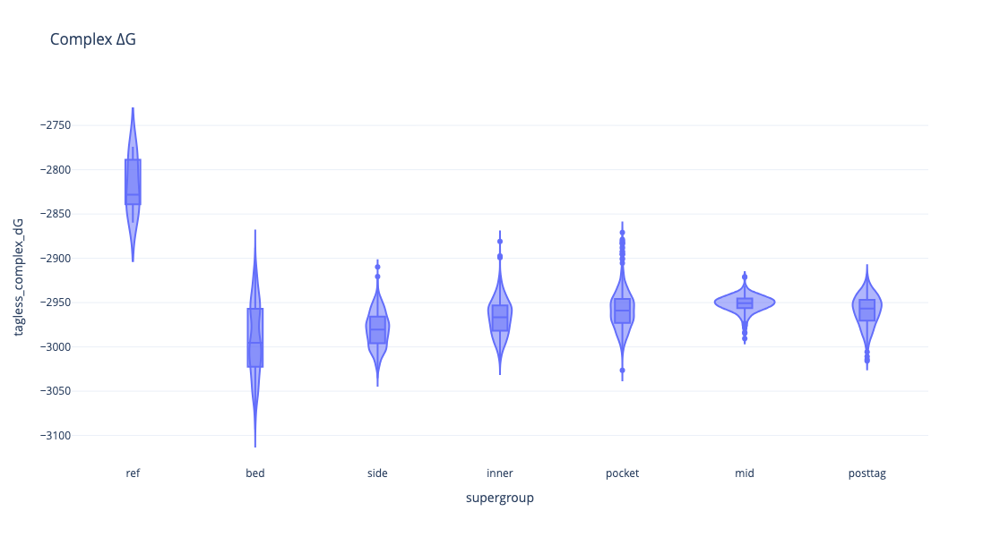

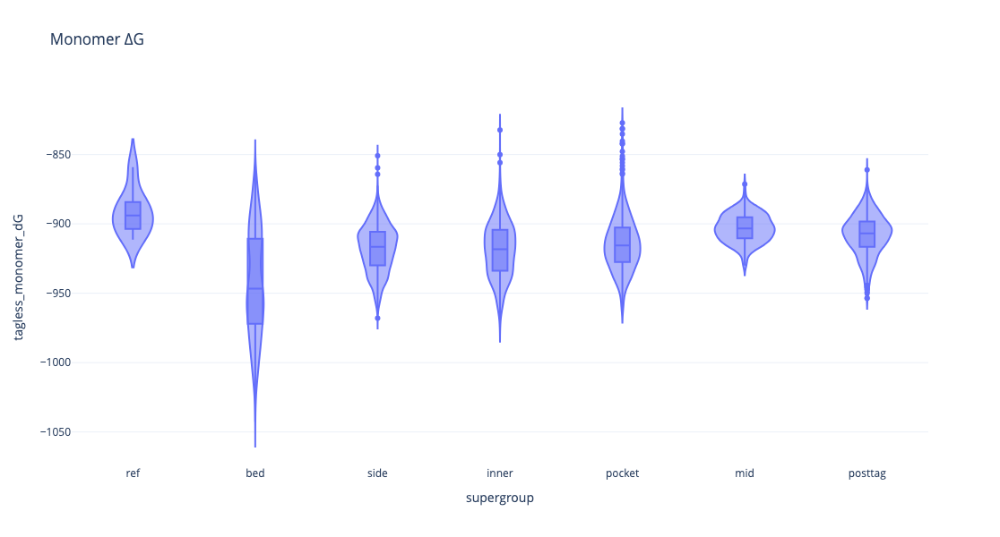

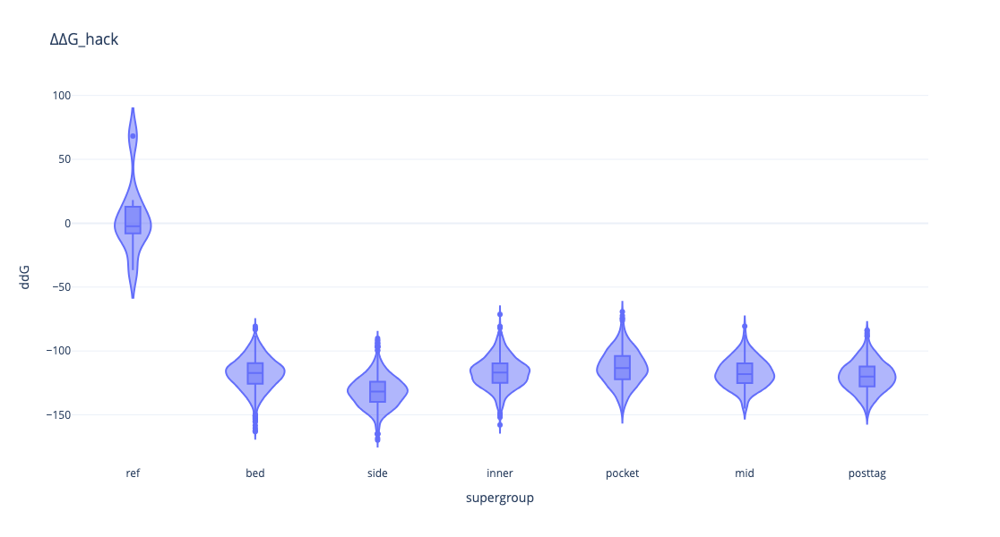

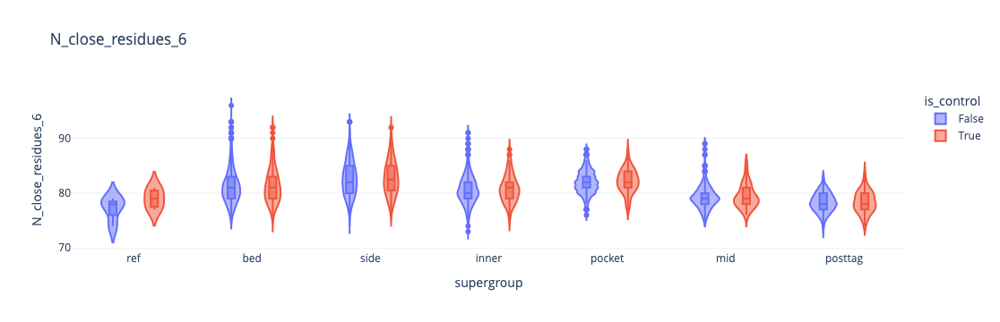

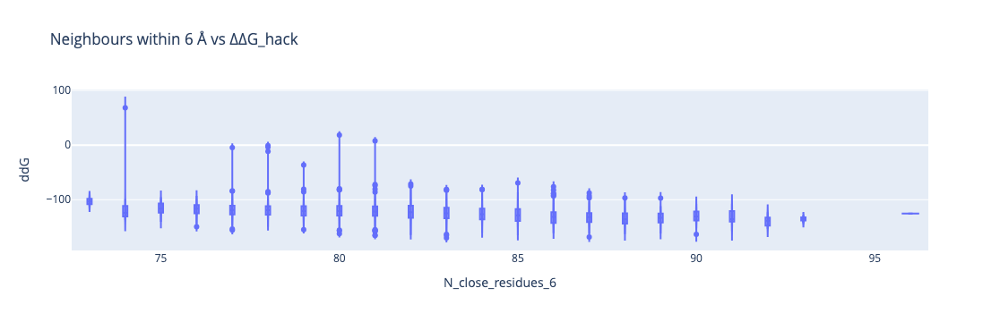

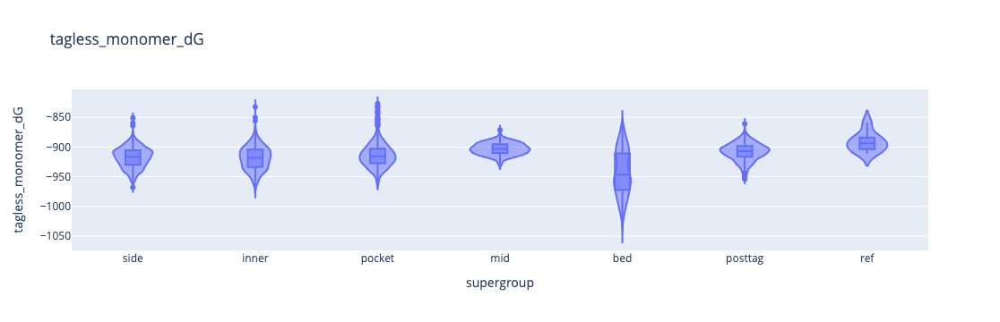

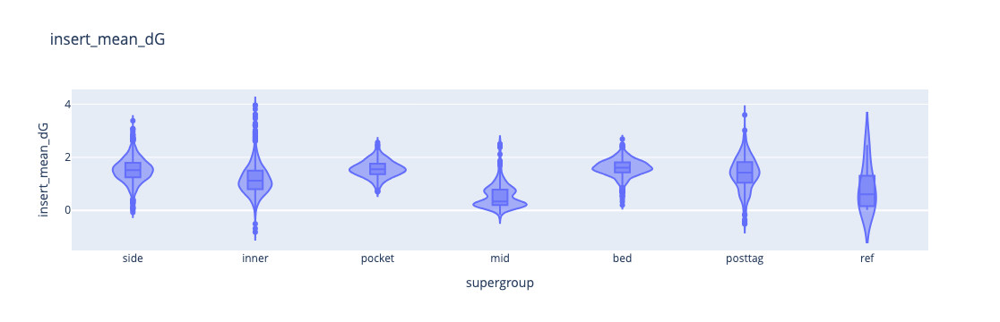

In [216]:
import plotly.express as px

supergroup_order = ['ref', 'bed', 'side', 'inner', 'pocket', 'mid',  'posttag']

px.violin(df, x='supergroup', y='tagless_complex_dG',
          #color='is_control',
          category_orders={'supergroup': supergroup_order},
          box=True,
          title='Complex ∆G', template='plotly_white',
          height=600,
          ).show()

px.violin(df, x='supergroup', y='tagless_monomer_dG',
          #color='is_control',
          category_orders={'supergroup': supergroup_order},
          box=True,
          title='Monomer ∆G', template='plotly_white',
          height=600,
          ).show()

px.violin(df, x='supergroup', y='ddG', box=True,
          category_orders={'supergroup': supergroup_order},
          title='∆∆G_hack', template='plotly_white',
          height=600,
          ).show()

px.violin(df, x='supergroup', y='N_close_residues_6', box=True,
          color='is_control',
          category_orders={'supergroup': supergroup_order},
          title='N_close_residues_6', template='plotly_white',
          ).show()

px.violin(df, 'N_close_residues_6', 'ddG', #color='supergroup',
          category_orders={'supergroup': supergroup_order},
          box=True,
          hover_name='name', title='Neighbours within 6 Å vs ∆∆G_hack'
          ).show()

px.violin(df, x='supergroup', y='tagless_monomer_dG', box=True,
          title='tagless_monomer_dG',
          ).show()

px.violin(df, x='supergroup', y='insert_mean_dG', box=True,
          title='insert_mean_dG',
          ).show()

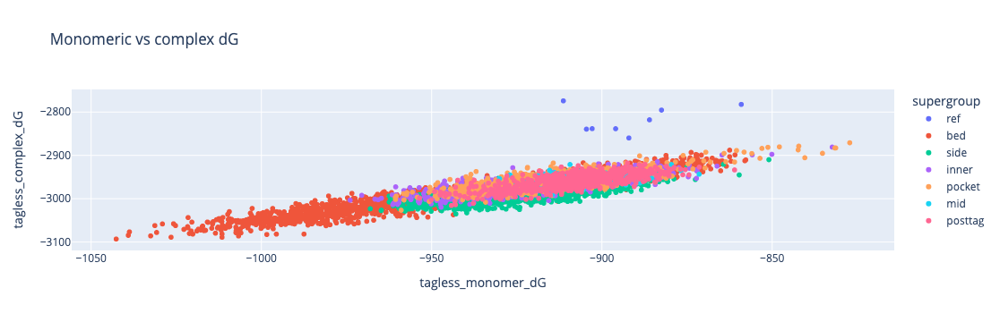

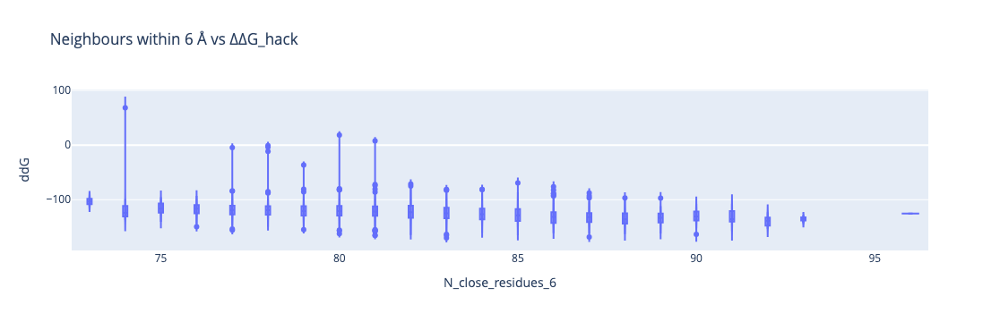

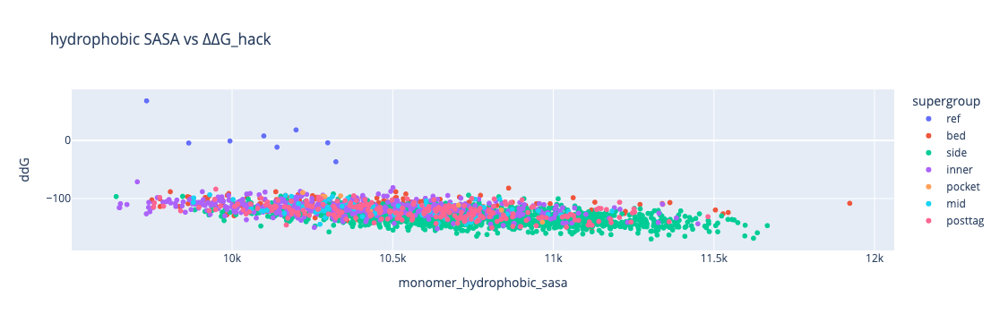

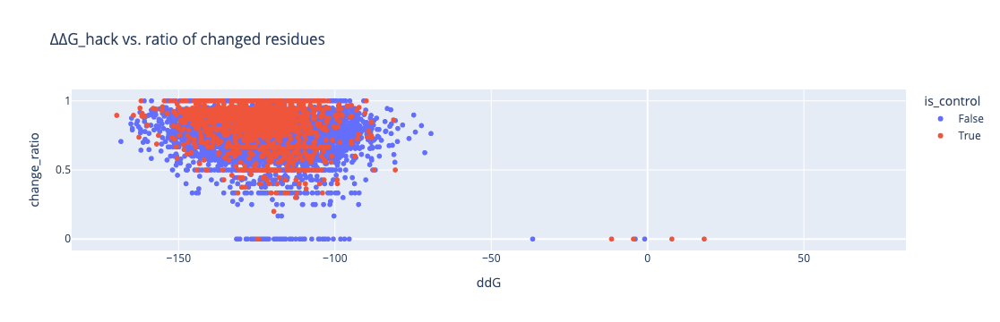

,count,mean,std,min,25%,50%,75%,max
is_control,,,,,,,,
False,5905.0,-2976.071360,30.172154,-3093.070240,-2994.841167,-2973.093411,-2954.641178,-2774.104840
True,1225.0,-2976.985695,30.904441,-3081.727256,-2996.081637,-2974.399360,-2956.014283,-2782.282755


count    7130.000000
mean        6.865928
std         0.754173
min         6.259920
25%         6.685907
50%         6.768905
75%         6.917124
max        26.777813
Name: max_per_res_scores, dtype: float64

Valid (df.N_close_residues_6 > 78) & (df.tagless_monomer_dG < -904) & (df.rmsd < 3.) 4701
corr ddG - rel hphobic SASA -0.5145133088072255


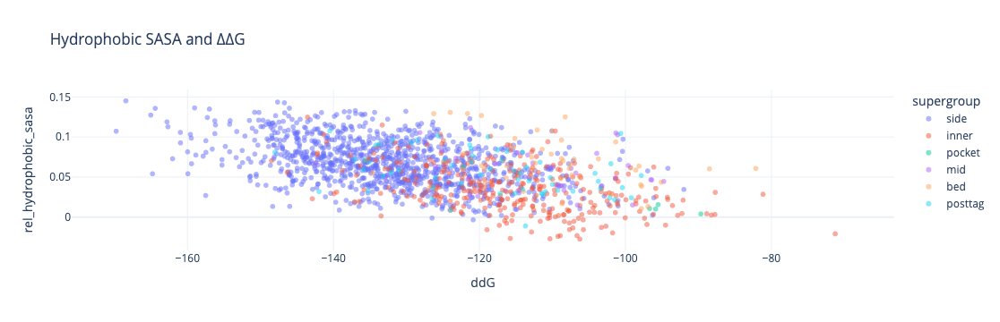

T-test for change_ratio controls: t-stat = -1.2e+01, p-value = 8.2e-33, ratio=1.08
T-test for ddG controls: t-stat = 4.5, p-value = 6.4e-06, ratio=1.02


In [217]:



px.scatter(df, 'tagless_monomer_dG', 'tagless_complex_dG', color='supergroup',
          hover_name='name', title='Monomeric vs complex dG',
          category_orders={'supergroup': supergroup_order},
          ).show()

px.violin(df, 'N_close_residues_6', 'ddG', #color='supergroup',
          box=True,
          hover_name='name', title='Neighbours within 6 Å vs ∆∆G_hack'
          ).show()

px.scatter(df, 'monomer_hydrophobic_sasa', 'ddG', color='supergroup',
          category_orders={'supergroup': supergroup_order},
           title='hydrophobic SASA vs ∆∆G_hack',
          hover_name='name',
          ).show()

px.scatter(df, 'ddG','change_ratio',  color='is_control',
           title='∆∆G_hack vs. ratio of changed residues',
          hover_name='name',
          ).show()

display(df.groupby('is_control').tagless_complex_dG.describe())
display(df.max_per_res_scores.describe())
sub = df.loc[(df.N_close_residues_6 > 78) & (df.tagless_monomer_dG < -904) & (df.rmsd < 3.)]
print('Valid (df.N_close_residues_6 > 78) & (df.tagless_monomer_dG < -904) & (df.rmsd < 3.)', len(sub))
print('corr ddG - rel hphobic SASA', sub.ddG.corr(sub.rel_hydrophobic_sasa))
px.scatter(sub, 'ddG', 'rel_hydrophobic_sasa', opacity=0.5, color='supergroup', template='plotly_white', title='Hydrophobic SASA and ∆∆G').show()

import scipy.stats as stats

col = 'change_ratio'
t_stat, p_value = stats.ttest_ind(df.loc[(~df.is_control) & ~df[col].isna()][col], df.loc[df.is_control & ~df[col].isna()][col])
ratio = df.loc[(df.is_control) & ~df[col].isna()][col].mean() / df.loc[(~df.is_control) & ~df[col].isna()][col].mean()
print(f"T-test for {col} controls: t-stat = {t_stat:.2}, p-value = {p_value:.2}, ratio={ratio:.3}")
col = 'ddG'
t_stat, p_value = stats.ttest_ind(df.loc[(~df.is_control) & ~df[col].isna()][col], df.loc[df.is_control & ~df[col].isna()][col])
ratio = df.loc[(df.is_control) & ~df[col].isna()][col].mean() / df.loc[(~df.is_control) & ~df[col].isna()][col].mean()
print(f"T-test for {col} controls: t-stat = {t_stat:.2}, p-value = {p_value:.2}, ratio={ratio:.3}")

In [169]:
wt = df.loc[df.name == 'ref_originalA'].iloc[0]
cols = 'name group tagless_complex_dG tagless_monomer_dG ddG change_ratio N_designed rmsd trimmed_changed_seq rel_hydrophobic_sasa delta_length'.split()

sub = df.loc[(df.N_close_residues_6 > wt.N_close_residues_6) &
             (df.tagless_monomer_dG < wt.tagless_monomer_dG + 2) & 
             (df.rmsd < 2.) & 
             (df.rel_hydrophobic_sasa < df.rel_hydrophobic_sasa.quantile(0.75)) & 
             (df.change_ratio < 0.7) & 
             (df.ddG < df.loc[df.group == 'ref'].ddG.min()) & 
             (df.max_per_res_scores < wt.max_per_res_scores)]
print(len(sub))
display(sub.supergroup.value_counts())
with pd.option_context("display.max_rows", 50):
    display(sub.sort_values('ddG')[cols].head(50))

163


supergroup
side       84
inner      57
bed         9
posttag     7
mid         6
Name: count, dtype: int64

,name,group,tagless_complex_dG,tagless_monomer_dG,ddG,change_ratio,N_designed,rmsd,trimmed_changed_seq,rel_hydrophobic_sasa,delta_length
217,side_1F,side,-3000.592023,-918.170126,-151.421897,0.692308,13,1.848940,.FYWLtgtDeAKNK.,0.045374,10
93,side_113B,side,-3004.914349,-924.006184,-149.908166,0.687500,16,1.678640,.FKWLNLagEdPRaHAe.,0.067847,13
2750,side4_22E,side4,-3007.593837,-928.616582,-147.977255,0.647059,17,1.677753,.fKDLIgIdlppYLAFLW.,0.035705,14
2828,side4_138D,side4,-2989.761993,-912.135448,-146.626545,0.529412,17,1.479862,.agKLFEdgWgVMTpgiV.,0.081572,14
2829,side4_71D,side4,-3010.598400,-936.295432,-143.302968,0.666667,15,1.597929,.FLIVlgLDdQrAKSl.,0.066934,12
3130,side4_163D,side4,-3002.064882,-928.253467,-142.811415,0.611111,18,1.817104,.llaMdDGDaWSRlLKDpA.,0.066556,15
17,side_182E,side,-2993.094547,-920.813548,-141.280999,0.583333,12,1.486188,.fKRagvLdADEL.,0.075276,9
4646,side4B_20D,side4B,-2984.945694,-913.894332,-140.051361,0.615385,13,1.985369,.AKalGAgLpNaFI.,0.058120,10
1848,inner3_226E,inner3,-2986.820144,-916.245550,-139.574594,0.500000,12,1.074728,.gMADANSngvgg.,0.031285,10
530,side_154F,side,-3008.566509,-938.493723,-139.072786,0.650000,20,1.798609,.LKWLfIAAteeAkKeFNSlI.,0.072338,17


In [204]:
wts = df.loc[(df.group == 'ref') & ~df.is_control]
df['hard_filter'] = ((df.N_close_residues_6 > wts.N_close_residues_6.max()) &
                     (df.tagless_monomer_dG < wts.tagless_monomer_dG.min() + 2) &
                     (df.ddG < wts.ddG.min()) & 
                     (df.max_per_res_scores < wt.max_per_res_scores + 0.5))

df['strict_filter'] = ((df.N_close_residues_6 > wt.N_close_residues_6) &
             (df.tagless_monomer_dG < wt.tagless_monomer_dG + 2) & 
             (df.rmsd < 3.) & 
             (df.rel_hydrophobic_sasa < df.rel_hydrophobic_sasa.quantile(0.75)) & 
             (df.change_ratio < 0.7) & 
             (df.ddG < df.loc[df.group == 'ref'].ddG.min()) & 
             (df.max_per_res_scores < wt.max_per_res_scores))

df['strictest_filter'] = ((df.N_close_residues_6 > wt.N_close_residues_6) &
             (df.tagless_monomer_dG < wt.tagless_monomer_dG + 2) & 
             (df.rmsd < 2.) & 
             (df.rel_hydrophobic_sasa < df.rel_hydrophobic_sasa.quantile(0.25)) & 
             (df.change_ratio < 0.6) & 
             (df.ddG < df.loc[df.group == 'ref'].ddG.min()) & 
             (df.max_per_res_scores < wt.max_per_res_scores))

keepers = '.WT. .WD. .LAG. .RAG.'.split()  # these stood out on checks

df['of_special_interest'] = df.strict_filter.astype(int) + 2 * df.trimmed_changed_seq.str.upper().isin(keepers)

In [205]:
df.trimmed_changed_seq.str.upper().value_counts().sort_values(ascending=False).head(20)

trimmed_changed_seq
.AG.        123
.LAG.        34
.RAG.        19
.GD.         15
.GTDGG.       5
.GAAD.        5
.WT.          5
.GVG.         4
.GG.          4
.WAA.         4
.LAGG.        4
.GA.          4
.LD.          3
.GLLAPD.      3
.AEEG.        3
.WGLGNG.      3
.AEGG.        3
.GT.          3
.APGG.        3
.LVP.         3
Name: count, dtype: int64

In [206]:
wts = df.loc[(df.group == 'ref') & ~df.is_control]
wts.ddG

3910    -3.930052
3917    -0.912560
3919   -36.738130
3920    68.220082
Name: ddG, dtype: float64

In [227]:
# hard filters
sub = df.loc[df.hard_filter | df.of_special_interest].sort_values('ddG').drop_duplicates('sequence').copy()

# soft filters
def normalize_and_smooth(series: pd.Series) -> pd.Series:
    """
    Normalize a pandas Series using Z-score normalization, then apply a tanh smooth 
    transformation to taper values beyond ±2 sigma.
    """
    z_scores = (series - series.mean()) / series.std()
    smoothed = np.tanh(z_scores / 2) * 2  # Rescale to taper at ±2
    return pd.Series(smoothed, index=series.index).fillna(0)

# High-good columns
high_good_cols = ['N_close_residues_6']
for k in high_good_cols:
    sub[f'nor_{k}'] = (
        sub.groupby('supergroup')[k]
        .transform(normalize_and_smooth)
    )
    nors.append(f'nor_{k}')

# Low-good columns
low_good_cols = ['tagless_monomer_dG', 'ddG', 'rmsd', 'change_ratio', 'rel_hydrophobic_sasa', 'max_per_res_scores']
for k in low_good_cols:
    sub[f'nor_{k}'] = (
        sub.groupby('supergroup')[k]
        .transform(lambda x: normalize_and_smooth(-x))
    )
    nors.append(f'nor_{k}')

# Combine
weights = {
    'nor_N_close_residues_6': 0.5,
    'nor_tagless_monomer_dG': 2.,
    'nor_ddG': 1.,
    'nor_rmsd': 0.8,
    'nor_change_ratio': 0.3,
    'nor_rel_hydrophobic_sasa': 0.5,
    'nor_max_per_res_scores': 0.1,
}

sub['master_z'] = sum(sub[col] * weight for col, weight in weights.items())
sub['master_z'] = sub.groupby('supergroup')['master_z'].transform(
    lambda x: (x - x.mean()) / x.std()
)

In [228]:
pd.DataFrame({'hard': sub.supergroup.value_counts(),
              'strict': sub.loc[sub.strict_filter].supergroup.value_counts(),
              'strictest': sub.loc[sub.strictest_filter].supergroup.value_counts(),
              'high_zscore': sub.loc[sub.master_z > 1].supergroup.value_counts(),
              'mid_zscore': sub.loc[sub.master_z > 0].supergroup.value_counts(),
             }).fillna(0).astype(int)

,hard,strict,strictest,high_zscore,mid_zscore
supergroup,,,,,
bed,1050,9,1,195,505
inner,438,77,23,75,217
mid,24,1,0,4,13
pocket,362,1,0,63,176
posttag,94,7,0,17,45
side,1677,107,8,312,821


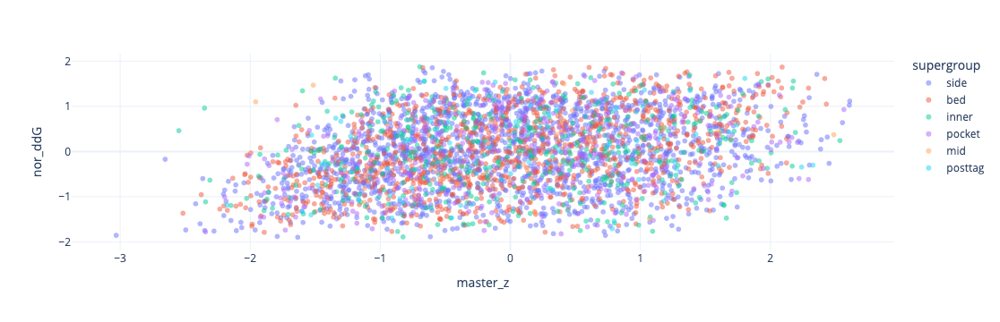

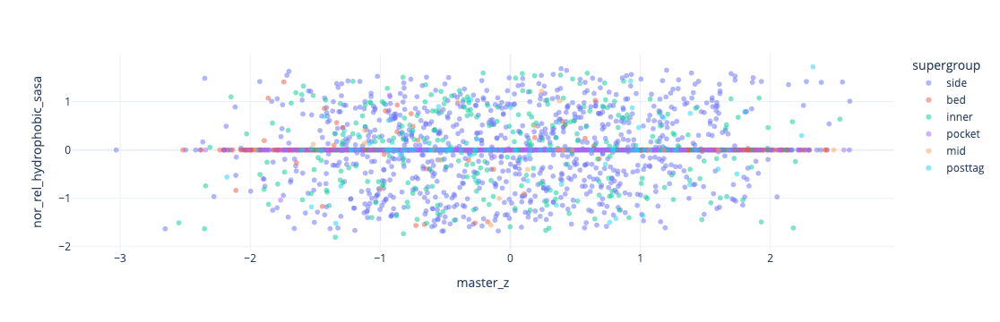

In [245]:
px.scatter(sub, 'master_z', 'nor_ddG', color='supergroup', opacity=0.5, template='plotly_white').show()
px.scatter(sub, 'master_z', 'nor_rel_hydrophobic_sasa', color='supergroup', opacity=0.5, template='plotly_white').show()

In [230]:
selection = sub.loc[(sub.master_z > 1) | sub.of_special_interest].sort_values(['of_special_interest', 'master_z'], ascending=False)


for name, s in selection.groupby('supergroup'):
    print(f' ## {name}\n', ' - '.join(sorted(s.head(10).trimmed_changed_seq.str.upper().unique(), key=len)))

 ## bed
 .EKEFPVNADTLAV. - .EEEMKNTSDLRGLIV. - .EKDLEEMVREFTKIAV. - .DKTMDEEVKKAEERLKSAL. - .DHQMDERVQKAEERLKGKV. - .ADGAEKFLKEIWEILTGIL. - .EDDDRESLDKFTTEWAKLTF. - .ELDPRMYGSTVEEAIKAAELIWQIILKEMAKTGGMGTW. - .VFPPESYGSTRDDLKKVSTEVEQKWKALLKKAGLSGPW. - .DYDLEPPDSGSQGDDHQLAKEGYKAYLKLMEKLKKKETKMLQTLGSAV.
 ## inner
 .WT. - .WD. - .WLGDGTKGPMVAI. - .GGVKQAGKPAGLI. - .ATGVLEGYELLPGQGA. - .NGGVHPGQPLQPGIGV. - .GWGVLNGVPMWATNAGTV. - .GGGDWRGTSFQPGPGGGF. - .GMGTFHGVSGTGGPYGGT. - .AGAVYNGSGGGTVKDGGGLI.
 ## mid
 .LAG. - .RAG. - .LAGG. - .RAYLEGYPT. - .LAAFYIPAYGQYLPP. - .LAKEYDPHKGQWKPP. - .LANMFIPAHGEYLDM.
 ## pocket
 .IMFTRMTI.PTEGRYA.FTADTI.VNSVW.GPGE. - .MGYSDLGFYV.PWAPA.FTLDL.AGALAGI.ALTKKAFI. - .QGVDEIAAAI.PYLPM.VALAG.AGGAAAL.GNALKMFW. - .IDDTGLY.FGGDEWAILA.FAASL.AFGHLAI.GWYAAIY. - .LAGDGGV.NNTDETWIKW.AAFHA.AMGGLAA.GVKAAKY. - .LGAQI.PGIETAEKM.LGDGADAAIY.IAGGASAM.DLDPR. - .GGLGAFAVIF.LETEMLRRA.MAAGGDGPS.VHGVW.ERGGD. - .IAYADAATQI.TGGDEWLRKA.VAAGL.AGGLAAM.AYGDGR. - .ASLVSSNIF.LDNDEVRIA.VLGVLGA

In [233]:
import tarfile
import io
import gzip

instructions = ''
for group, ssub in selection.groupby('supergroup'):
    instructions += '## '+group + '\n'

    with tarfile.open(f'copies2/{group}.tar.gz', "w:gz") as tar:
      
        for i, row in ssub.head(10).iterrows():
            instructions += f'({row["name"].replace("Ø", "")} and chain A and resi {"+".join(map(str, row.mod_idxs))}) or \\\n'
            path = Path('output') / row.group / 'tuned_pdbs' / (row['name']+'.pdb.gz')
            content = gzip.open(path, 'rt').read()
            file_data = io.BytesIO(content.encode("utf-8"))
            tar_info = tarfile.TarInfo(name=row['name']+'.pdb')
            tar_info.size = len(content)
            tar.addfile(tarinfo=tar_info, fileobj=file_data)

Path('pymol_cmd.txt').write_text(instructions)

6050

In [235]:
for group, ssub in selection.reset_index(drop=True).groupby('supergroup'):
    with open(f'copies2/{group}.fa', 'w') as fh:
        for i, row in ssub.head(10).iterrows():
            fh.write(f'>{row["name"]} global_rank={i+1} group={group} ddG={row.ddG:.1f} rmsd={row.rmsd:.1f} monomer_dG={row.tagless_monomer_dG:.1f} N_close_res={row.N_close_residues_6} h_sasa={row.rel_hydrophobic_sasa:.1f}\n')
            fh.write(f'{row.camelized_seq}\n\n')

In [247]:
## Save the heavies

instructions = ''

with open(f'copies2/heavies.fa', 'w') as fh, tarfile.open(f'copies2/heavies.tar.gz', "w:gz") as tar:
    for group, ssub in selection.reset_index(drop=True).sort_values('delta_length', ascending=False).groupby('supergroup'):
        row = ssub.iloc[0]

        instructions += f'({row["name"].replace("Ø", "")} and chain A and resi {"+".join(map(str, row.mod_idxs))}) or \\\n'
            
        fh.write(f'>{row["name"]} global_rank={i+1} group={group} ddG={row.ddG:.1f} rmsd={row.rmsd:.1f} monomer_dG={row.tagless_monomer_dG:.1f} N_close_res={row.N_close_residues_6} h_sasa={row.rel_hydrophobic_sasa:.1f}\n')
        fh.write(f'{row.camelized_seq}\n\n')
        path = Path('output') / row.group / 'tuned_pdbs' / (row['name']+'.pdb.gz')
        content = gzip.open(path, 'rt').read()
        file_data = io.BytesIO(content.encode("utf-8"))
        tar_info = tarfile.TarInfo(name=row['name']+'.pdb')
        tar_info.size = len(content)
        tar.addfile(tarinfo=tar_info, fileobj=file_data)
print(instructions)

(bedbig4B_216E and chain A and resi 6+7+8+9+10+11+12+13+14+15+16+17+18+19+20+21+22+23+24+25+26+27+28+29+30+31+32+33+34+35+36+37+38+39+40+41+42+43+44+45+46+47+48+49+50+51+52+53) or \
(inner3_234F and chain A and resi 141+142+143+144+145+146+147+148+149+150+151+152+153+154+155+156+157+158+159+160) or \
(mid4_223B and chain A and resi 37+38+39+40+41+42+43+44+45+46+47+48+49+50+51) or \
(pocketfill4_269E and chain A and resi 22+23+24+25+26+27+28+29+30+31+52+53+54+55+56+57+58+84+85+86+87+88+89+90+91+92+117+118+119+120+121+143+144+145+146+147+148+149+150+151+152) or \
(posttag4_117D and chain A and resi 157+158+159+160+161+162+163+164+165+166+167+168+169+170+171+172+173+174+175+176) or \
(side_77F and chain A and resi 60+61+62+63+64+65+66+67+68+69+70+71+72+73+74+75+76+77+78+79) or \



In [ ]:
## Preferences?

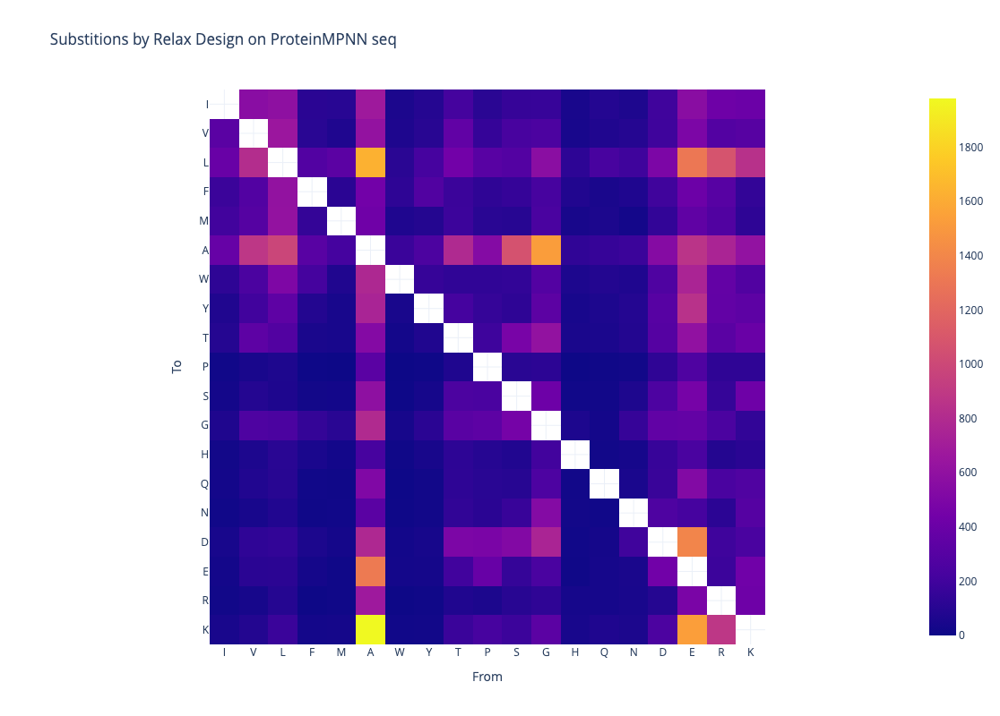

In [293]:
import itertools
AAs = 'IVLFMAWYTCPSGHQNDERK'
# Tuple of (from, to)
substitutions = {(a1, a2): 0 for  a1, a2 in itertools.product(list(AAs), repeat=2)}

for i, row in df.loc[(~df.is_control) & (df.group != 'ref')].iterrows():
    if isinstance(row.original_seq, float) or isinstance(row.sequence, float):
        continue
    for o, r in zip(row.original_seq, row.sequence):
        substitutions[o, r] += 1

#print(substitutions['A', 'S'])

# to=index, from=column
AAs_noC = 'IVLFMAWYTPSGHQNDERK'
subn_df = pd.DataFrame([[substitutions[row, col] for row in AAs_noC] for col in AAs_noC], columns=list(AAs_noC), index=list(AAs_noC))

#print(subn_df.loc['S']['A'])

if False:  # normalise?
    # for each from column
    tally = subn_df.sum(axis=0)
    
    for col in tally.index: # tally is series based on columns
        subn_df[col] = subn_df[col] / tally[col]
    
for col in tally.index:
    subn_df.at[col, col] = float('nan')

#print(subn_df.loc['S']['A'], subn_df.loc['S'].sum(), subn_df['A'].sum())

fig = px.imshow(subn_df,
                template='plotly_white',
                height=800,
                title='Substitions by Relax Design on ProteinMPNN seq')
fig.update_layout(
    xaxis=dict(tickmode='linear', title='From'),
    yaxis=dict(tickmode='linear', title='To'),
    #margin=dict(l=100, r=100, t=50, b=100)  # Adjust margins if necessary
)

fig.show()

In [283]:
raise EndOfTheLine

NameError: name 'EndOfTheLine' is not defined

In [ ]:
df['nor_sum'] = df[nors].sum(axis=1)

display(sub.supergroup.value_counts())

In [ ]:
group = name.split('_')[0]
    gzip_path = Path('output') / group / 'tuned_pdbs' / (name+'.pdb.gz')
    pdb_path = Path('copies') / (name+'.pdb')
    with gzip.open(gzip_path, 'rt') as gfh, open(pdb_path, 'w') as fh:

In [ ]:
sub = df.loc[(df.N_close_residues_6 > 78) &
             (df.tagless_monomer_dG < -904) & 
             (df.rmsd < 3.) & 
             (df.rel_hydrophobic_sasa < 0.081367) & 
             (df.change_ratio < 0.6) & 
             (df.ddG < -127.745940) & 
             (df.max_per_res_scores < 6.900720)]
print(len(sub))
display(sub.supergroup.value_counts())
sub.sort_values('ddG')['name rmsd group tagless_complex_dG tagless_monomer_dG ddG change_ratio N_designed trimmed_changed_seq rel_hydrophobic_sasa delta_length'.split()]

In [ ]:
#df.loc[df.name == 'side_61D'].iloc[0][cols]

In [ ]:
raise EndOfTheLine

In [ ]:

df['trimmed_changed_seq']

In [ ]:
# (df.change_ratio < 0.5) & 
df.loc[(df.N_close_residues_6 > 78) & (df.tagless_monomer_dG < -904) & (df.rmsd < 3.)]['name group tagless_complex_dG tagless_monomer_dG ddG change_ratio N_designed trimmed_changed_seq'.split()].sort_values('change_ratio').head(50)

In [ ]:
for name, s in sub.groupby('supergroup'):
    print(f' ## {name}\n', ' - '.join(sorted(s.trimmed_changed_seq.str.upper().unique(), key=len)))

In [ ]:
for l, c in df.loc[df.group == 'mid4'].length.value_counts().items():
    print(l, df.loc[(df.group == 'mid4') & (df.length == l)].trimmed_changed_seq.to_list())
    

In [ ]:
df.loc[(df.original_seq.fillna('GGGG').str.find('GGGG') == -1)].group.value_counts()

In [ ]:
df.loc[(df.N_close_residues_6 > 78) & (df.tagless_monomer_dG < -904) & (df.change_ratio < 0.5) & (df.rmsd < 3.)]['name group tagless_complex_dG ddG change_ratio N_designed trimmed_changed_seq'.split()].sort_values('change_ratio')

In [284]:


sub.rel_hydrophobic_sasa.describe()

count    1230.000000
mean        0.059826
std         0.031201
min        -0.027460
25%         0.038351
50%         0.059739
75%         0.081081
max         0.136235
Name: rel_hydrophobic_sasa, dtype: float64

In [285]:
# size='shifted_delta_length', 


In [286]:
sub.ddG.describe()

count    3645.000000
mean     -123.872621
std        14.591968
min      -169.778590
25%      -133.932074
50%      -124.440633
75%      -114.016398
max       -69.264320
Name: ddG, dtype: float64

In [287]:
df.loc[df.name == 'ref_originalA'].max_per_res_scores

3920    6.826549
Name: max_per_res_scores, dtype: float64

In [288]:
df.max_per_res_scores.describe()

count    7130.000000
mean        6.865928
std         0.754173
min         6.259920
25%         6.685907
50%         6.768905
75%         6.917124
max        26.777813
Name: max_per_res_scores, dtype: float64

In [289]:
df['hallucination_N'] = df.name.str.split('_', expand=True)[1].str.extract(r'(\d+)').fillna(-1).astype(int)
sub = df.loc[(df.N_close_residues_6 > 78) & (df.tagless_monomer_dG < -904) & (df.rmsd < 3.) & (df.rel_hydrophobic_sasa < 0.081367) & (df.change_ratio < 0.6) & (df.ddG < -127.745940) & (df.max_per_res_scores < 6.900720)]
print(len(sub))
display(sub.supergroup.value_counts())
sub.sort_values('ddG')['name rmsd group tagless_complex_dG tagless_monomer_dG ddG change_ratio N_designed trimmed_changed_seq rel_hydrophobic_sasa delta_length'.split()]

17


supergroup
side     14
inner     3
Name: count, dtype: int64

,name,rmsd,group,tagless_complex_dG,tagless_monomer_dG,ddG,change_ratio,N_designed,trimmed_changed_seq,rel_hydrophobic_sasa,delta_length
616,side_165E,2.342898,side,-3004.207770,-923.823922,-149.383848,0.550000,20,.aaQMvdaFEWtgLeAKrAVY.,0.075238,17
2659,side4_9C,1.901114,side4,-3010.172412,-933.528299,-145.644113,0.333333,18,.faRqHgeEaleeVrkNgV.,0.040097,15
3120,side4_129C,2.084044,side4,-3016.703576,-940.442624,-145.260952,0.555556,18,.FAILNggTeWaTRVakkq.,0.076971,15
17,side_182E,1.486188,side,-2993.094547,-920.813548,-141.280999,0.583333,12,.fKRagvLdADEL.,0.075276,9
580,side_46C,2.314989,side,-2980.049457,-908.666306,-140.383152,0.571429,14,.gLaAVgANDKPele.,0.049746,11
1848,inner3_226E,1.074728,inner3,-2986.820144,-916.245550,-139.574594,0.500000,12,.gMADANSngvgg.,0.031285,10
262,side_241C,1.818137,side,-3000.815191,-931.369133,-138.446058,0.583333,12,.FArYDeeTLRkl.,0.051596,9
144,side_61D,1.480553,side,-3001.378339,-932.935234,-137.443105,0.526316,19,.IKaLFgdgpegeMWlDVYR.,0.071214,16
365,side_191F,1.352037,side,-2989.088938,-921.538135,-136.550802,0.538462,13,.FAaHvDTeQarKa.,0.061847,10
2143,inner3_192E,2.800995,inner3,-2977.837329,-911.176967,-135.660362,0.500000,8,.ggNgHVPp.,0.070588,6


In [290]:
sub.sort_values('tagless_monomer_dG')['name rmsd group tagless_complex_dG tagless_monomer_dG ddG change_ratio N_designed trimmed_changed_seq rel_hydrophobic_sasa delta_length'.split()]

,name,rmsd,group,tagless_complex_dG,tagless_monomer_dG,ddG,change_ratio,N_designed,trimmed_changed_seq,rel_hydrophobic_sasa,delta_length
3120,side4_129C,2.084044,side4,-3016.703576,-940.442624,-145.260952,0.555556,18,.FAILNggTeWaTRVakkq.,0.076971,15
2659,side4_9C,1.901114,side4,-3010.172412,-933.528299,-145.644113,0.333333,18,.faRqHgeEaleeVrkNgV.,0.040097,15
144,side_61D,1.480553,side,-3001.378339,-932.935234,-137.443105,0.526316,19,.IKaLFgdgpegeMWlDVYR.,0.071214,16
262,side_241C,1.818137,side,-3000.815191,-931.369133,-138.446058,0.583333,12,.FArYDeeTLRkl.,0.051596,9
177,side_42E,2.299595,side,-2988.267673,-925.167612,-132.100060,0.533333,15,.faILMgLAYpAPpey.,0.049801,12
616,side_165E,2.342898,side,-3004.207770,-923.823922,-149.383848,0.550000,20,.aaQMvdaFEWtgLeAKrAVY.,0.075238,17
587,side_84B,1.992350,side,-2988.975967,-922.946604,-135.029364,0.538462,13,.FrILlgddPRFVa.,0.038958,10
365,side_191F,1.352037,side,-2989.088938,-921.538135,-136.550802,0.538462,13,.FAaHvDTeQarKa.,0.061847,10
17,side_182E,1.486188,side,-2993.094547,-920.813548,-141.280999,0.583333,12,.fKRagvLdADEL.,0.075276,9
1848,inner3_226E,1.074728,inner3,-2986.820144,-916.245550,-139.574594,0.500000,12,.gMADANSngvgg.,0.031285,10


In [291]:
row = df.loc[df.name == 'side_61D'].iloc[0]

print(row.original_seq.split('KDETET')[0])
print(row.changed_seq.split('KDETET')[0])
print(row.sequence.split('KDETET')[0])

MKIYYEHDADLGFILGKKVAVLGFGSQGHAHAHNLKDSGVDVRVGLRKGSRSWEKAEAALRAQIGDGPEGERALAERGVLPVAEAVREADVVMVLLPDEKQAQVYREEVEPNLKEGGALAFAHGFNVHFGQIKPRKDLDVWMVAPKGPGHLVRSEYGGGSNWSHPQFEKRPPGGSGVPALVAVHQDASGSAFPTALAYAKAIGAARAGVIATTF
...........................................................IKaLFgdgpegeMWlDVYR.........................................................................................................................................................................................................................................................................
MKIYYEHDADLGFILGKKVAVLGFGSQGHAHAHNLKDSGVDVRVGLRKGSRSWEKAEAAIKALFGDGPEGEMWLDVYRVLPVAEAVREADVVMVLLPDEKQAQVYREEVEPNLKEGGALAFAHGFNVHFGQIKPRKDLDVWMVAPKGPGHLVRSEYGGGSNWSHPQFEKRPPGGSGVPALVAVHQDASGSAFPTALAYAKAIGAARAGVIATTF


In [292]:
LRAQIGDGPEGERALAERG
IKALFGDGPEGEMWLDVYR

60+61+63+64+72+73+75+76+77+78+79

NameError: name 'LRAQIGDGPEGERALAERG' is not defined

In [ ]:
import gzip

for name in sub.sort_values('tagless_monomer_dG').drop_duplicates('hallucination_N').name:
    group = name.split('_')[0]
    gzip_path = Path('output') / group / 'tuned_pdbs' / (name+'.pdb.gz')
    pdb_path = Path('copies') / (name+'.pdb')
    with gzip.open(gzip_path, 'rt') as gfh, open(pdb_path, 'w') as fh:
        fh.write( gfh.read() )

In [ ]:
' or '.join([f'({row["name"].replace("Ø", "")} and chain A and resi {"+".join(map(str, row.mod_idxs))})' for i, row in sub.sort_values('tagless_monomer_dG').drop_duplicates('hallucination_N').iterrows()])

In [ ]:
wt_len = df.loc[df.name == 'ref_originalA'].length.iloc[0]
df.loc[df.length == wt_len]['name rmsd group tagless_complex_dG tagless_monomer_dG ddG change_ratio N_designed trimmed_changed_seq'.split()].sort_values('tagless_complex_dG')

In [ ]:
df.loc[(df.name == 'ref_originalA') & (df.ddG < 0)].sort_values('ddG')

In [ ]:
seq = df.loc[(df.name == 'ref_originalA')].iloc[0].sequence
for group, sdf in df.loc[(df.length == wt_len) & (df.ddG < 0)].sort_values('ddG').groupby('supergroup'):
    
    print(group)
    print('.'+''.join([seq[i-1] for i in sdf.iloc[0].mod_idxs])+'.')
    print(sdf.trimmed_changed_seq.value_counts())

In [ ]:
df.loc[df.name == 'ref_originalA']['name rmsd group tagless_complex_dG  tagless_monomer_dG ddG change_ratio N_designed trimmed_changed_seq'.split()]

In [ ]:
df.loc[(df.supergroup == 'inner') & (df.length == wt_len)].sort_values('ddG')['name rmsd group tagless_complex_dG  tagless_monomer_dG ddG change_ratio N_designed trimmed_changed_seq'.split()]

In [ ]:
posttag
GGSGVP
DEYgAP

In [ ]:
## Fix issue?

from pathlib import Path
import gzip
import pickle

def load_summary(pdbgz_path, wrong_suffix='.pdb.gz'):
    folder_path = path.parent.parent
    summary_path = folder_path / 'summary' / pdbgz_path.name.replace(wrong_suffix, '.pkl')
    with summary_path.open('rb') as fh:
        info = pickle.load(fh)
    return info

def dump_summary(pdbgz_path, info, wrong_suffix='.pdb.gz'):
    folder_path = path.parent.parent
    summary_path = folder_path / 'summary' / pdbgz_path.name.replace(wrong_suffix, '.pkl')
    with summary_path.open('wb') as fh:
        pickle.dump(info, fh)

def remove_original_seq_info(path):
    info = load_summary(path, '.pkl')
    if 'original_seq' in info:
        del info['original_seq']
        dump_summary(path, info, '.pkl')
    
        
for path in Path('output').glob('*/summary/*.pkl'):
    folder_path = path.parent.parent
    design_name = path.stem
    
    seq_path = folder_path / f'seqs/{design_name[:-1]}.fa'
    if not seq_path.exists():
        remove_original_seq_info(path)
        continue
    for letter, seq_record in zip('ØBCDEFGHIJKLMNOPQRSTUVWXYZ', SeqIO.parse(seq_path, 'fasta')):
        if letter == design_name[-1]:
            # ## Read metadata
            metadata = {k: float(v) for k, v in re.findall(r'([\w_]+)=([\d.]+)', seq_record.description)}
            info = load_summary(path, '.pkl')
            info.update(metadata)
            info['original_seq'] = str(seq_record.seq)
            dump_summary(path, info, '.pkl')
            break
    else:
        print(f'No match for {design_name} - tried up to {letter}')
        remove_original_seq_info(path)

In [ ]:
# inner3_77D G141W G142D
inner3_100B G141W G142T

In [ ]:
!cp output/inner3/tuned_pdbs/inner3_100B.pdb.gz copies/inner3_100B.pdb.gz

In [ ]:
df.loc[df.name == 'bed3_200E'].iloc[0].original_seq

In [ ]:
df.loc[df.name == 'bed3_200E'].iloc[0].changed_seq

In [ ]:
GLSGTVRGLG
AWsgtvPglg

In [ ]:
subn_df['C'].loc['A']

In [ ]:
subn_df.sum(axis=0)

In [ ]:
subn_df['C'].loc['A']

In [ ]:
subn_df.sum(axis=0)

In [ ]:
MKIYYEHDADLGFILGKKVAVLGFGSQGHAHAHNLKDSGVDVRVGLRKGSRSWEKAEAAIKALFGDGPEGEMWLDVYRVLPVAEAVREADVVMVLLPDEKQAQVYREEVEPNLKEGGALAFAHGFNVHFGQIKPRKDLDVWMVAPKGPGHLVRSEYGGGSNWSHPQFEKRPPGGSGVPALVAVHQDASGSAFPTALAYAKAIGAARAGVIATTF:MEAGITGTWYNQLGSTFIVTAGADGALTGTYESAVGNAESRYVLTGRYDSAPATDGSGTALGWTVAWKNNYRNAHSATTWSGQYVGGAEARINTQWLLTSGTTEANAWKSTLVGHDTFTKVKP:MEAGITGTWYNQLGSTFIVTAGADGALTGTYESAVGNAESRYVLTGRYDSAPATDGSGTALGWTVAWKNNYRNAHSATTWSGQYVGGAEARINTQWLLTSGTTEANAWKSTLVGHDTFTKVKP